<a href="https://colab.research.google.com/github/SofiaFreiman/Lung_epitelium/blob/main/QC_filtering_and_batch_correction.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip install scanpy leidenalg scikit-misc adjustText gseapy bbknn cellrank scvelo
import os
os.kill(os.getpid(), 9)

In [ ]:
import warnings
warnings.filterwarnings("ignore")

import time
import os
import pandas as pd
import numpy as np
import scipy.stats
import scanpy as sc
import matplotlib.pyplot as plt
import seaborn as sns
import scanpy.external as sce
import anndata
from matplotlib_venn import venn3
from matplotlib_venn import venn2

sc.settings.verbosity = 1
sns.set(font_scale = 1.2)
sns.set_style("whitegrid")

In [ ]:
plt.rcParams['font.family'] = 'Liberation Serif'

In [ ]:
l2_colors = {'Basal cells': 'tab:green', 'Suprabasal cells': 'darkseagreen', 'Goblet cells': 'mediumaquamarine', 'Secretory cells': 'burlywood', 'Ciliated cells': 'mediumpurple', 'Ionocytes': 'orangered', 'Deuterosomal cells': 'deeppink'}
l3_colors = {'Basal cells' : "tab:green", 'Suprabasal cells' : "darkseagreen", "Goblet cells" : "mediumaquamarine", "Secretory cells" : "burlywood", "FOS/JUN-positive" : "cornflowerblue", "FOS/JUN-negative" : "mediumpurple", "Ionocytes" : "orangered", "Deuterosomal cells" : "deeppink"}
path = "drive/MyDrive/LU/Pavan_data/"
path_figs = "drive/MyDrive/LU/Pavan_data/figs/"

In [ ]:
adata = sc.read(path + "adata_current.h5ad")

In [ ]:
adata.obs['anno_l2_tmp'] = adata.obs['anno_l2'].replace({'Basal cells' : 'Basal\ncells', 'Ciliated cells' : 'Ciliated\ncells', 'Deuterosomal cells' : 'Deuterosomal\ncells', 'Goblet cells' : 'Goblet\ncells', 'Secretory cells' : 'Secretory\ncells', 'Suprabasal cells' : 'Suprabasal\ncells'})
adata.obs['anno_l2_tmp'] = adata.obs['anno_l2_tmp'].cat.reorder_categories(['Basal\ncells', 'Suprabasal\ncells', 'Goblet\ncells', 'Secretory\ncells', 'Ciliated\ncells', 'Ionocytes', 'Deuterosomal\ncells'])
adata.obs['age_group'] = adata.obs['sname'].replace({'Sample17H-quant_res' : "young", 'Sample_21-quant_res' : "young", 'nextseq1.Sample1-quant_res' : "young", 'Sample18H-quant_res' : 'aged',
                                                     'nextseq4.Sample_9-quant_res' : "young", 'nextseq5.Sample11-quant_res' : "aged", 'nextseq3.sample_1-quant_res': "young",
                                                     'nextseq3.sample_2-quant_res' : "young", 'nextseq6.Pavan1_S1-quant_res' : "aged", 'nextseq5.Sample10-quant_res' : "young"})

In [ ]:
!curl -o cell_cycle_genes.txt https://raw.githubusercontent.com/theislab/scanpy_usage/master/180209_cell_cycle/data/regev_lab_cell_cycle_genes.txt

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100   556  100   556    0     0   3209      0 --:--:-- --:--:-- --:--:--  3213


In [ ]:
cell_cycle_genes = [x.strip() for x in open('cell_cycle_genes.txt')]
s_genes = cell_cycle_genes[:43]
g2m_genes = cell_cycle_genes[43:]
cell_cycle_genes = [x for x in cell_cycle_genes if x in adata.var_names]
sc.tl.score_genes_cell_cycle(adata, s_genes = s_genes, g2m_genes = g2m_genes)

## QC

In [ ]:
# Plot descriptive plots for the dataset
def qc(adata):
  fig, axs = plt.subplots(ncols = 6, nrows = 1, figsize = (24, 4), layout = "constrained")

  sns.distplot(adata.obs['total_counts'], kde = False, ax = axs[0], hist_kws={"alpha":1}, color = 'g', bins = 100)
  axs[0].set_xlabel("n UMI per cell (total counts)", fontsize = 10); axs[0].set_ylabel('n cells', fontsize = 10);
  axs[0].set_xlim(0, 80000); #axs[0].set_ylim(0, 800);
  axs[0].xaxis.set_major_locator(plt.MaxNLocator(5))

  sns.distplot(adata.obs['n_genes_by_counts'], kde = False, ax = axs[1], hist_kws={"alpha":1}, color = 'b')
  axs[1].set_xlabel("n genes per cell", fontsize = 10); axs[1].set_ylabel('n cells', fontsize = 10);
  axs[1].set_xlim(0, 10000);# axs[1].set_ylim(0, 350);

  sns.scatterplot(y = adata.obs["n_genes_by_counts"], x = adata.obs["total_counts"], ax=axs[2], s = 3, color = 'goldenrod')
  axs[2].set_xlabel("n UMI per cell (total counts)", fontsize = 10); axs[2].set_ylabel("n genes per cell", fontsize = 10)
  # axs[2].set_xlim(0, 152000)
  axs[2].xaxis.set_major_locator(plt.MaxNLocator(3))

  sns.distplot(adata.obs["pct_counts_mt"], kde = False, ax = axs[3], hist_kws={"alpha":1}, color = 'firebrick', bins = 100)
  axs[3].set_xlabel("% of mt expression", fontsize = 10); axs[3].set_ylabel('n cells', fontsize = 10)
  axs[4].set_xlim(0, 50); # axs[3].set_ylim(0, 1200);

  sns.distplot(adata.obs["pct_counts_ribo"], kde = False, ax = axs[4], hist_kws={"alpha":1}, color = 'firebrick', bins = 100)
  axs[4].set_xlabel("% of ribo expression", fontsize = 10); axs[4].set_ylabel('n cells', fontsize = 10)
  axs[5].set_xlim(0, 50); # axs[4].set_ylim(0, 520);

  sns.distplot(adata.obs["pct_counts_hb"], kde = False, ax = axs[5], hist_kws={"alpha":1}, color = 'firebrick')
  axs[5].set_xlabel("% of hb expression", fontsize = 10); axs[5].set_ylabel('n cells', fontsize = 10)
  axs[5].set_xlim(0, 50)

In [ ]:
from scipy.stats import median_abs_deviation

def is_outlier(adata, metric: str, nmads: int):
    M = adata.obs[metric]
    outlier = (M < np.median(M) - nmads * median_abs_deviation(M)) | (
        np.median(M) + nmads * median_abs_deviation(M) < M
    )
    return outlier

In [ ]:
adata.X = adata.layers['counts'].copy()
sc.pp.calculate_qc_metrics(adata, percent_top = None, log1p = True, inplace = True)

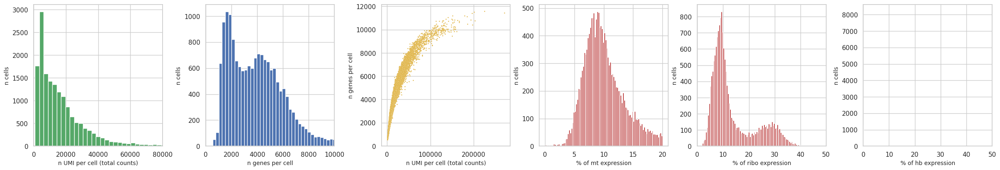

In [ ]:
qc(adata)

In [ ]:
adata.obs["outlier"] = (
    is_outlier(adata, "log1p_total_counts", 5)
    | is_outlier(adata, "log1p_n_genes_by_counts", 5)
    | is_outlier(adata, "pct_counts_in_top_20_genes", 5)
)
adata.obs.outlier.value_counts()

,count
outlier,
False,16244
True,268


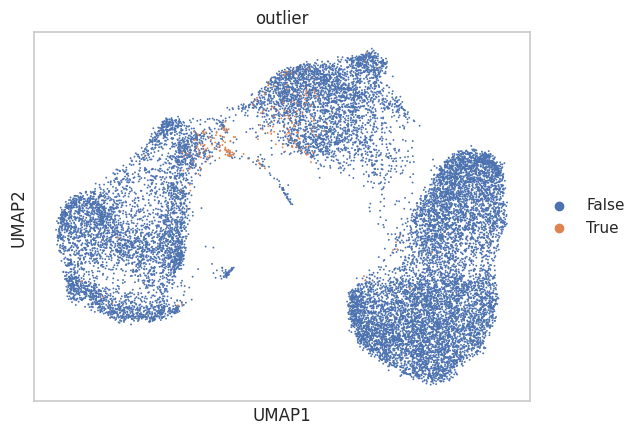

In [ ]:
sc.pl.umap(adata, color = ['outlier'], wspace = 0.4)

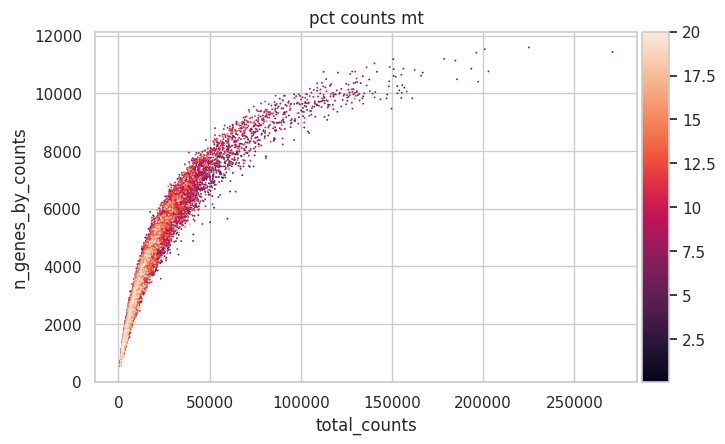

In [ ]:
p1 = sc.pl.scatter(adata, "total_counts", "n_genes_by_counts", color="pct_counts_mt")

In [ ]:
print(adata.obs['total_counts'].median())
adata.obs['tmp'] = (adata.obs['pct_counts_ribo'] < 5) | ((adata.obs['anno'] != "Ionocytes") & ((adata.obs['pct_counts_mt'] > 14) | ((adata.obs['pct_counts_mt'] > 12) & (adata.obs['total_counts'] < adata.obs['total_counts'].median()))))

adata.obs['tmp'].value_counts()

12634.0


,count
tmp,
False,12937
True,3575


In [ ]:
adata.obs['tmp'] = (adata.obs['anno'] != "Ionocytes") & (adata.obs['pct_counts_mt'] > 12)
adata.obs['tmp'].value_counts()

,count
tmp,
False,12516
True,3996


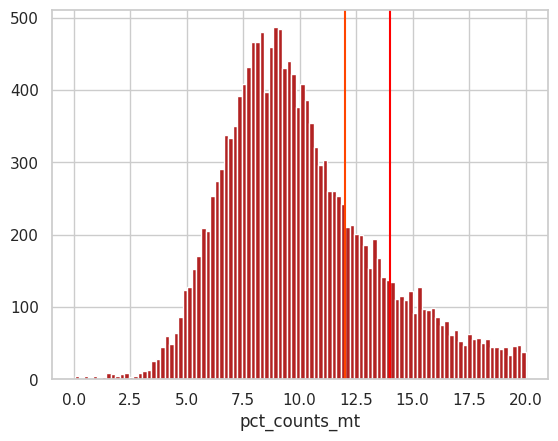

In [ ]:
sns.distplot(adata.obs["pct_counts_mt"], kde = False, hist_kws={"alpha":1}, color = 'firebrick', bins = 100)
plt.axvline(x = 14, color = 'red')
plt.axvline(x = 12, color = 'orangered')

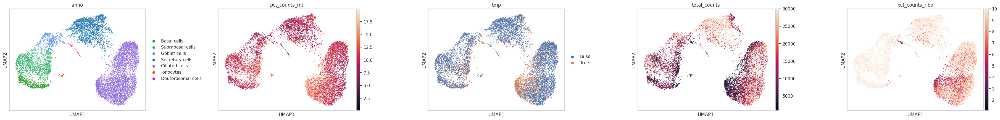

In [ ]:
sc.pl.umap(adata, color = ['anno', 'pct_counts_mt', 'tmp', 'total_counts', 'pct_counts_ribo'], wspace = 0.4, vmax = [None]*3+[3e4, 10], ncols = 5)
# sc.pl.umap(adata, color = ['total_counts'], wspace = 0.4, vmax = adata.obs['total_counts'].median())

In [ ]:
pd.crosstab(adata.obs['tmp'], adata.obs['anno'])

anno,Basal cells,Suprabasal cells,Goblet cells,Secretory cells,Ciliated cells,Ionocytes,Deuterosomal cells
tmp,,,,,,,
keep,802,2047,764,2894,5905,0,47
other,0,0,0,0,0,57,0
remove,229,694,190,402,2465,0,16


In [ ]:
cell_dict = {'KRT5' : 'Basal cells',
             'SCGB1A1' : 'Secretory cells',
             'MUC5B' : 'Goblet cells',
             'FOXJ1' : 'Ciliated cells',
             'ASCL3' : 'Ionocytes',
}

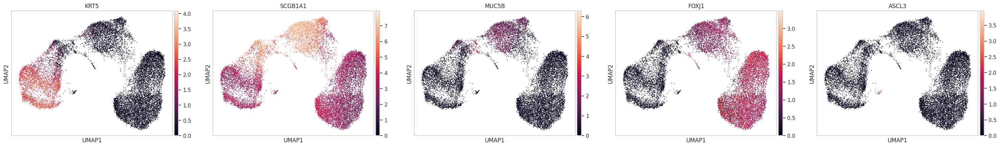

In [ ]:
sc.pl.umap(adata, color = cell_dict.keys(), ncols = len(cell_dict.keys()), layer = 'lognorm')

In [ ]:
print(adata.shape)
adata = adata[adata.obs['tmp'] == False].copy()
print(adata.shape)

(16512, 27052)
(12516, 27052)


In [ ]:
for i in adata.obs.columns:
  if i in ['n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'pct_counts_hb',]:
    del adata.obs[i]
for i in adata.var.columns:
  if i in ['n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts',]:
    del adata.var[i]

In [ ]:
adata.X = adata.layers['counts'].copy()
sc.pp.calculate_qc_metrics(adata, qc_vars=["mt", "ribo", "hb"], inplace=True, percent_top=None, log1p=False)
adata.X = adata.layers['lognorm'].copy()

## Batch correction

In [ ]:
adata.obs['sname'].value_counts()

,count
sname,
nextseq6.Pavan1_S1-quant_res,6043
nextseq5.Sample10-quant_res,2284
Sample17H-quant_res,1719
Sample18H-quant_res,1692
nextseq5.Sample11-quant_res,552
Sample_21-quant_res,123
nextseq3.sample_2-quant_res,42
nextseq1.Sample1-quant_res,32
nextseq3.sample_1-quant_res,20


In [ ]:
adata.X = adata.layers['lognorm'].copy()

In [ ]:
sc.pp.highly_variable_genes(adata, n_top_genes = 2500, layer = "counts", flavor = "seurat_v3")
adata.var["highly_variable"].mask(adata.var['mt'] == True, False, inplace = True)
sc.pp.pca(adata, use_highly_variable = True)
# sc.pp.neighbors(adata)
sce.pp.bbknn(adata, batch_key = 'sname')
sc.tl.umap(adata, min_dist = 0.4, random_state = 0, n_components=2)

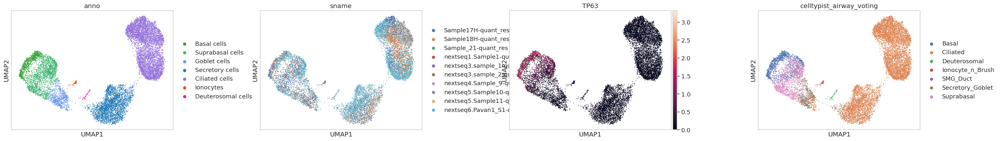

In [ ]:
sc.pl.umap(adata, color = ['anno', 'sname', 'TP63', "celltypist_airway_voting"], wspace = 0.4)

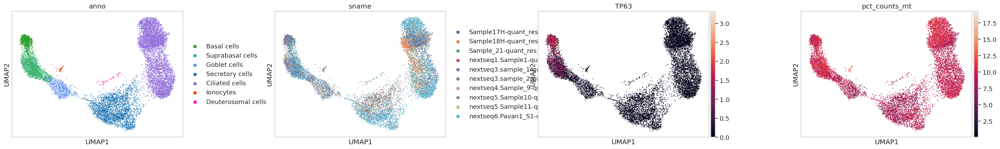

In [ ]:
sc.pl.umap(adata, color = ['anno', 'sname', 'TP63', 'pct_counts_mt'], components = ['1,2'], wspace = 0.4)

In [ ]:
sc.tl.umap(adata, min_dist = 0.4, random_state = 0, n_components=3)

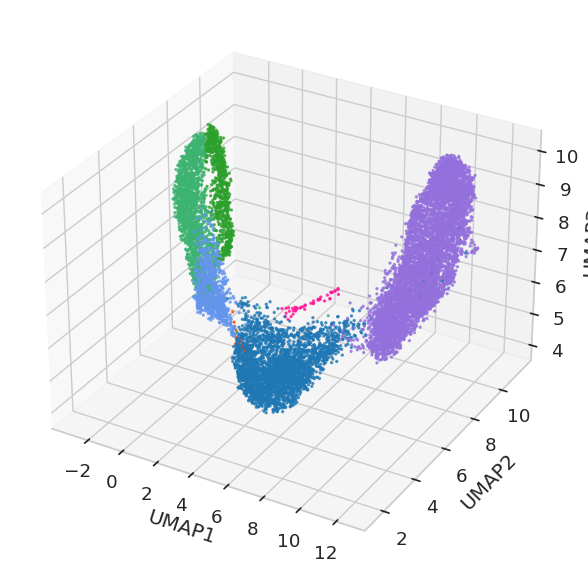

In [ ]:
x = adata.obsm['X_umap'][:, 0]
y = adata.obsm['X_umap'][:, 1]
z = adata.obsm['X_umap'][:, 2]

fig = plt.figure(figsize=(8, 6))
ax = fig.add_subplot(111, projection='3d')
colors = [l2_colors[i] for i in adata.obs['anno']]
ax.scatter(x, y, z, marker='o', alpha=0.7, c=colors, s = 2)

ax.set_xlabel('UMAP1')
ax.set_ylabel('UMAP2')
ax.set_zlabel('UMAP3')
plt.tight_layout()

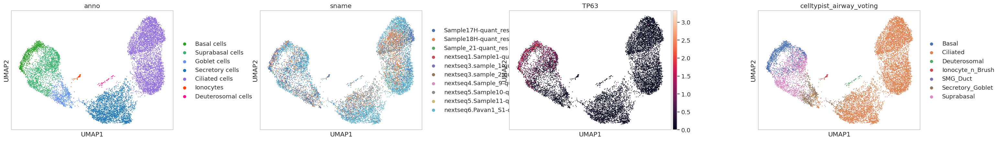

In [ ]:
sc.tl.umap(adata, min_dist = 0.33, random_state = 0, n_components=2)
sc.pl.umap(adata, color = ['anno', 'sname', 'TP63', "celltypist_airway_voting"], wspace = 0.4)

In [ ]:
for i in adata.obs.columns:
  if "leiden" in i:
    del adata.obs[i]

In [ ]:
for res in [0.5, 1, 1.5, 2]:
  sc.tl.leiden(adata, resolution = res, key_added = "leiden_" + str(res))

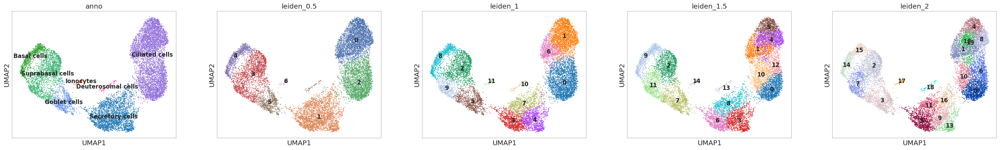

In [ ]:
sc.pl.umap(adata, color = ["anno"] + [i for i in adata.obs.columns if "leiden" in i], ncols = 5, legend_loc = 'on data', legend_fontsize=12)

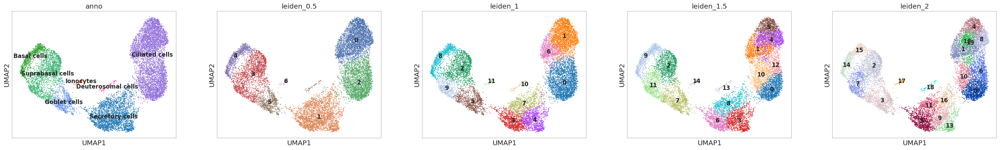

In [ ]:
sc.pl.umap(adata, color = ["anno"] + [i for i in adata.obs.columns if "leiden" in i], ncols = 5, legend_loc = 'on data', legend_fontsize=12)

In [ ]:
adata.obs['anno_l1'] = adata.obs['anno'].replace({"Basal cells" : "Basal-to-Goblet cells", "Suprabasal cells" : "Basal-to-Goblet cells", "Goblet cells" : "Basal-to-Goblet cells"})
adata.obs['anno_l2'] = adata.obs['anno'].copy()
adata.obs['anno_l3'] = adata.obs['anno'].copy().astype("category")
adata.obs['anno_l3'] = adata.obs['anno_l3'].cat.add_categories(["Ciliated-1", "Ciliated-2"])
adata.obs['anno_l3'] = adata.obs['anno_l3'].replace({"Ciliated cells" : "Ciliated-1"})
## Fine correction
for i in adata.obs.index:
  for s in ['0']:
    if adata.obs.loc[i, 'leiden_0.5'] == s:
      adata.obs.loc[i, 'anno_l3'] = "Ciliated-2"
print(set(adata.obs['anno_l3']))

{'Ciliated-1', 'Basal cells', 'Suprabasal cells', 'Ciliated-2', 'Secretory cells', 'Deuterosomal cells', 'Ionocytes', 'Goblet cells'}


In [ ]:
ct_colors = {'Basal cells' : "tab:green", 'Suprabasal cells' : "mediumseagreen", "Goblet cells" : "cornflowerblue", "Secretory cells" : "tab:blue", "Ciliated-1" : "mediumpurple", "Ciliated-2" : "purple", "Ionocytes" : "orangered", "Deuterosomal cells" : "deeppink"}
adata.obs['anno_l3'] = adata.obs['anno_l3'].cat.reorder_categories(ct_colors.keys())

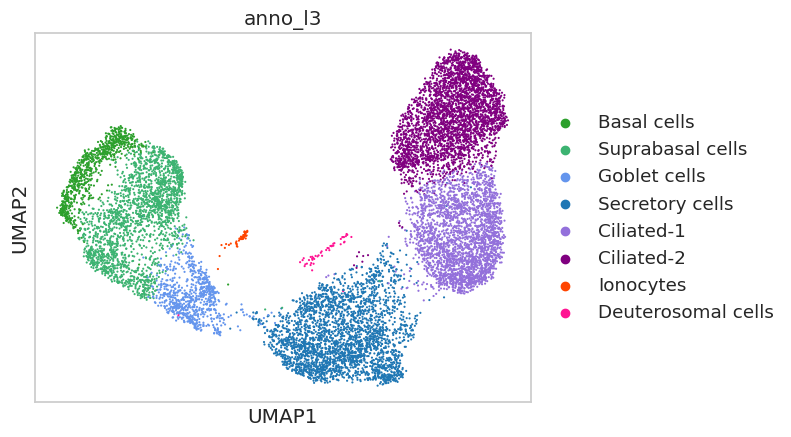

In [ ]:
sc.pl.umap(adata, color = ["anno_l3"], palette = l3_colors)

In [ ]:
sc.tl.rank_genes_groups(adata, 'anno_l3', method='wilcoxon', key_added = "wilcoxon")

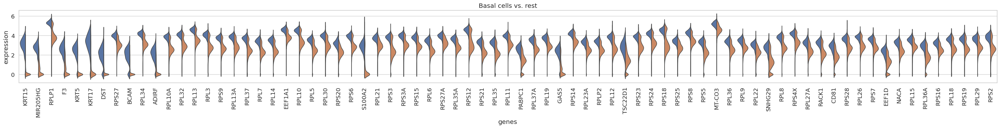

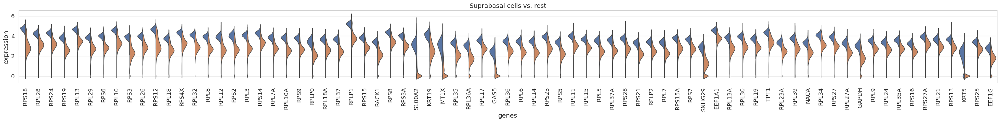

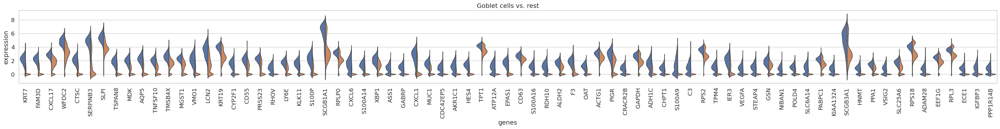

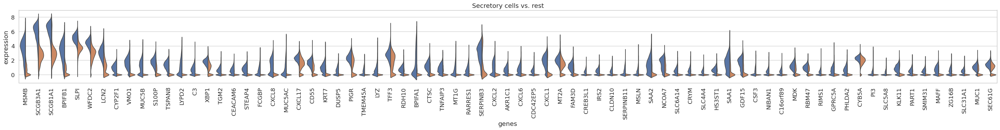

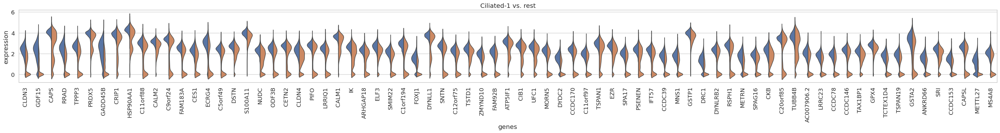

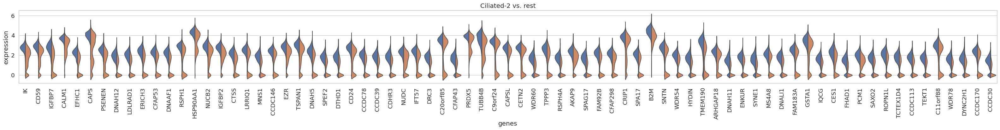

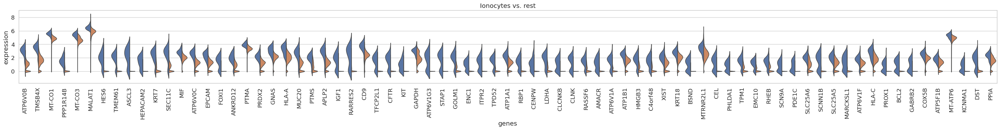

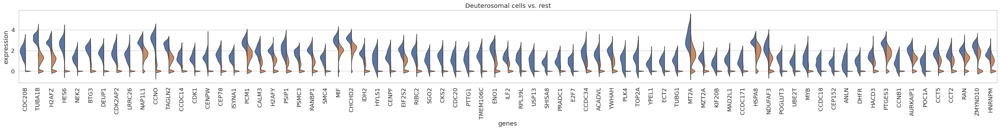

In [ ]:
from matplotlib.pyplot import rc_context
with rc_context({'figure.figsize': (40, 3)}):
    sc.pl.rank_genes_groups_violin(adata, n_genes=75, strip=False, key = 'wilcoxon')